## Notebook to generate custom initialized walkers to help with quicker convergence

In [1]:
import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings("ignore", "Wswiglal-redir-stdio")

import numpy as np
import emcee
import json

# for plotting
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import sys, os
sys.path.append('/home/simona.miller/time-domain-gw-inference')
from time_domain_gw_inference import group_postprocess, utils, run_sampler, waveform_h5s

### Load in `emcee` backend from non-converged run

In [2]:
# Load posterior and likelihood manager
def load_TD_results(fpath): 

    # Load in the result
    result = group_postprocess.load_run_settings_from_directory(
        fpath,
        filename_dict={'full':'full_0.0seconds'}
    )
    
    # Likelihood manager 
    lm = result['runs']['full']['likelihood_manager']  
    
    # Extract the posterior
    posterior = result['dfs']['full']

    # To match bilby convention
    posterior['polarization'] = posterior['polarization'] % np.pi
    posterior['phase'] = np.where(posterior['phase'] < 0, posterior['phase'] + 2 * np.pi, posterior['phase'])

    # Needed for prior reweighting later
    posterior['chirp_mass'] = utils.get_chirpmass(posterior['mass1'], posterior['mass2'])

    return posterior, result, lm 

run = '250805_output'
fpath = '../output/'+run
TD_posterior, TD_result, lm = load_TD_results(fpath)

warning! neither mean_anomaly nor mean_anomaly_periastron in df.columns!
warning! neither mean_anomaly nor mean_anomaly_periastron in df.columns!
warning! neither mean_anomaly nor mean_anomaly_periastron in df.columns!


In [3]:
# Load emcee backend
f = f'../output/{run}/full_0.0seconds/full_0.0seconds.h5'
backend = emcee.backends.HDFBackend(f, read_only=True) 

thin = 500
chain = backend.get_chain(thin=thin)
chain_flattened = chain.reshape(-1, chain.shape[2]) 

In [4]:
print(chain.shape)
print(chain_flattened.shape)

(100, 512, 20)
(51200, 20)


### We want the *sampled* parameters with an lnL cut

In [5]:
# Get posterior
ln_posterior = backend.get_log_prob(thin=thin)

# Get prior
ln_prior_flattened = lm.log_prior.get_lnprior(chain_flattened.T)
ln_prior = ln_prior_flattened.reshape(ln_posterior.shape)

# Calculate likelihood
ln_likelihood = ln_posterior - ln_prior

In [6]:
print(ln_likelihood.shape)

(100, 512)


In [7]:
# Threshold on the likelihood
lnL_CUT = -3255
mask = ln_likelihood>lnL_CUT

print('# points with lnL > cut:', sum(sum(mask)))
print('# points with lnL < cut:', sum(sum(~mask)))

# points with lnL > cut: 17781
# points with lnL < cut: 33419


In [8]:
# Transform chains to physical space for plotting
_chain_phys = lm.samp_to_phys([chain[:,:,i].flatten() for i in range(chain.shape[-1])])

_chain_phys['mass_1'], _chain_phys['mass_2'] = utils.m1m2_from_mtotq(_chain_phys['total_mass'], _chain_phys['mass_ratio'])
_chain_phys['chi_eff'] = utils.chi_effective(
    _chain_phys['mass_1'], _chain_phys['spin1_magnitude'], _chain_phys['spin1_z']/_chain_phys['spin1_magnitude'], 
    _chain_phys['mass_2'], _chain_phys['spin2_magnitude'], _chain_phys['spin2_z']/_chain_phys['spin1_magnitude']
)
_chain_phys['chi_p'] = utils.chi_precessing(
    _chain_phys['mass_1'], _chain_phys['spin1_magnitude'], _chain_phys['spin1_z']/_chain_phys['spin1_magnitude'], 
    _chain_phys['mass_2'], _chain_phys['spin2_magnitude'], _chain_phys['spin2_z']/_chain_phys['spin1_magnitude']
)

chain_phys = {k:v.reshape(chain.shape[0], chain.shape[1]) for k,v in _chain_phys.items()}

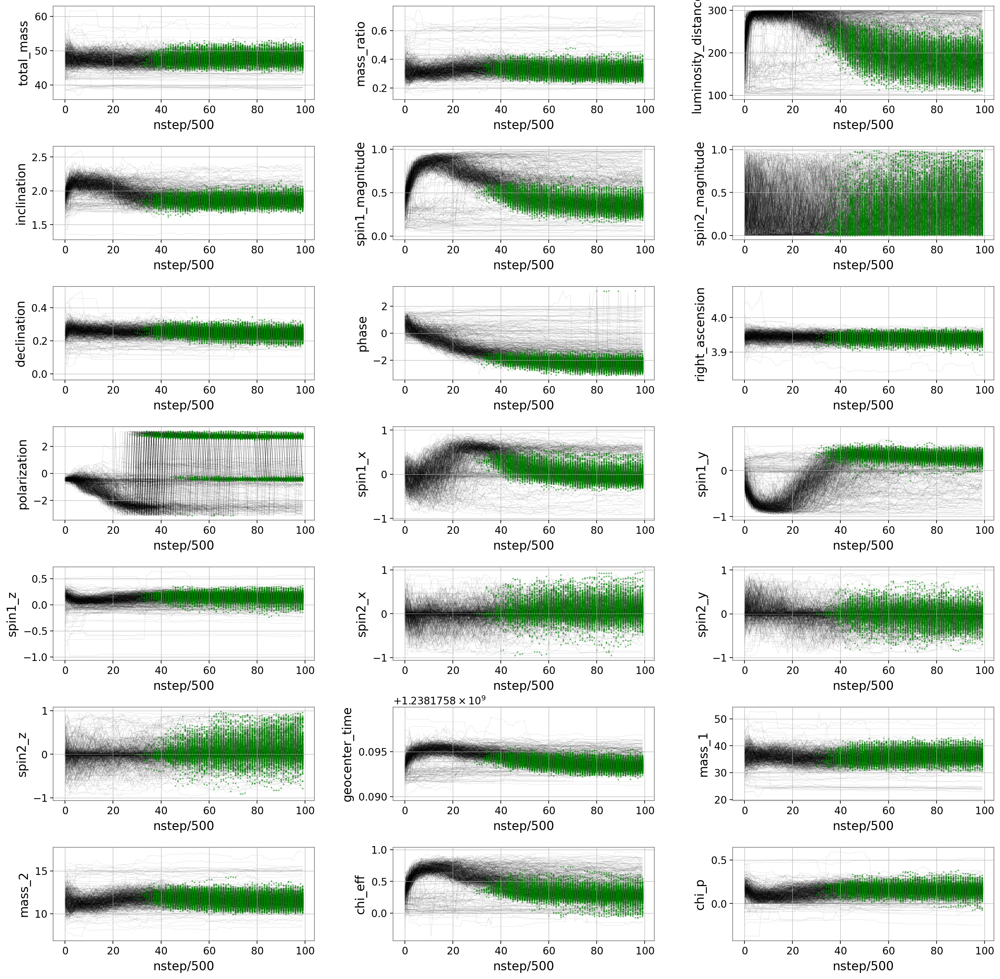

In [9]:
# Plot the chains PHYSICAL parameters that do vs. do not pass the cut
fig, axes = plt.subplots(7,3,figsize=(20,20)) 

for param,ax in zip(chain_phys.keys(), axes.flatten()):
    for ch,m in zip(chain_phys[param].T, mask.T):

        steps = np.arange(len(ch))
        ax.plot(steps, ch, color='k', lw=0.5, alpha=0.1, zorder=0)
        ax.scatter(steps[m], ch[m], color='green', s=1, alpha=0.4, zorder=1)
        
    ax.set_ylabel(param)
    ax.set_xlabel(f'nstep/{thin}')
    
plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.show()

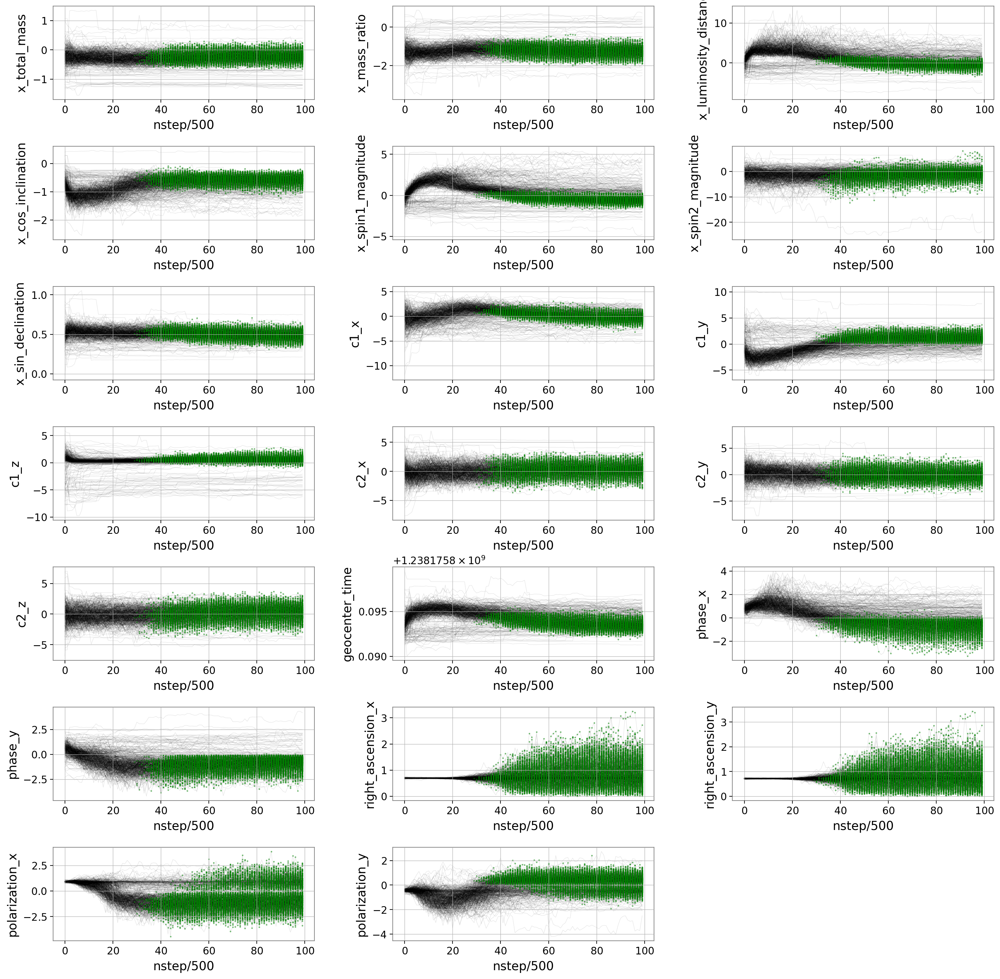

In [10]:
# Plot the chains of the SAMPLED parameters that do vs. do not pass the cut

fig, axes = plt.subplots(7,3,figsize=(20,20)) 

for param, ax in zip(lm.sampled_keys, axes.flatten()):

    ch = chain[:,:,lm.sampled_keys.index(param)]

    for x,m in zip(ch.T, mask.T):

        steps = np.arange(len(x))
        ax.plot(steps, x, color='k', lw=0.5, alpha=0.1, zorder=0)
        ax.scatter(steps[m], x[m], color='green', s=1, alpha=0.4, zorder=1)
        
    ax.set_ylabel(param)
    ax.set_xlabel(f'nstep/{thin}')

axes[-1][-1].set_visible(False)
plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.show()

Apply the mask to the chains:

In [11]:
print(chain.shape)
print(mask.shape)

(100, 512, 20)
(100, 512)


In [12]:
masked_chain = chain[mask]
print(masked_chain.shape)

(17781, 20)


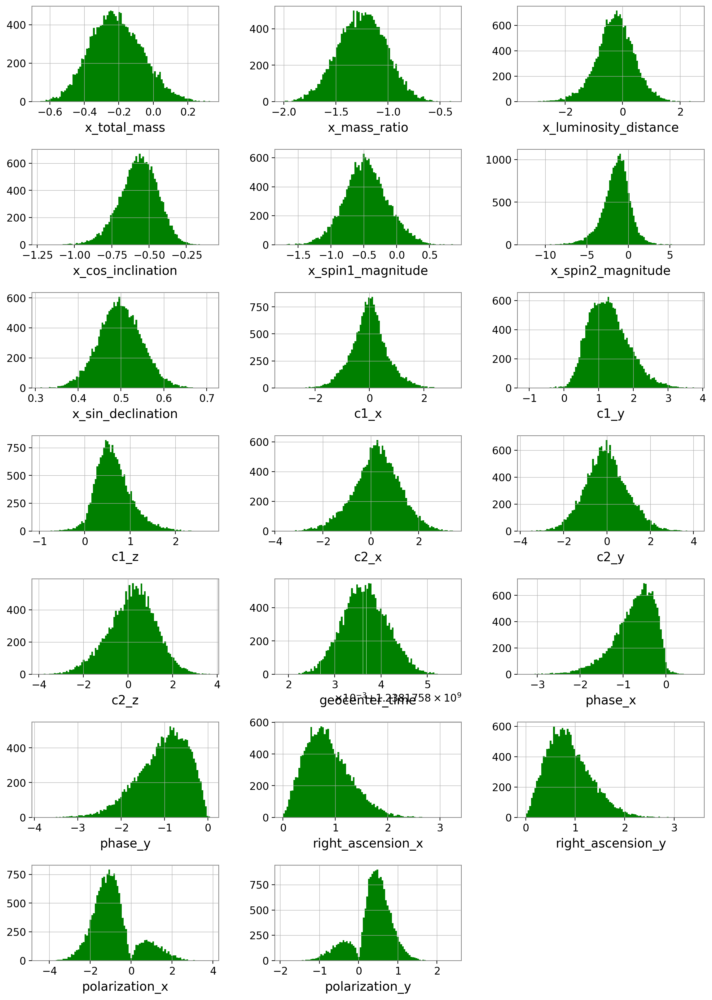

In [13]:
fig, axes = plt.subplots(7,3,figsize=(14,20)) 

for param, ax in zip(lm.sampled_keys, axes.flatten()):

    ax.hist(masked_chain[:,lm.sampled_keys.index(param)], bins=100, color='green')
    ax.set_xlabel(param)

axes[-1][-1].set_visible(False)
plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.show()

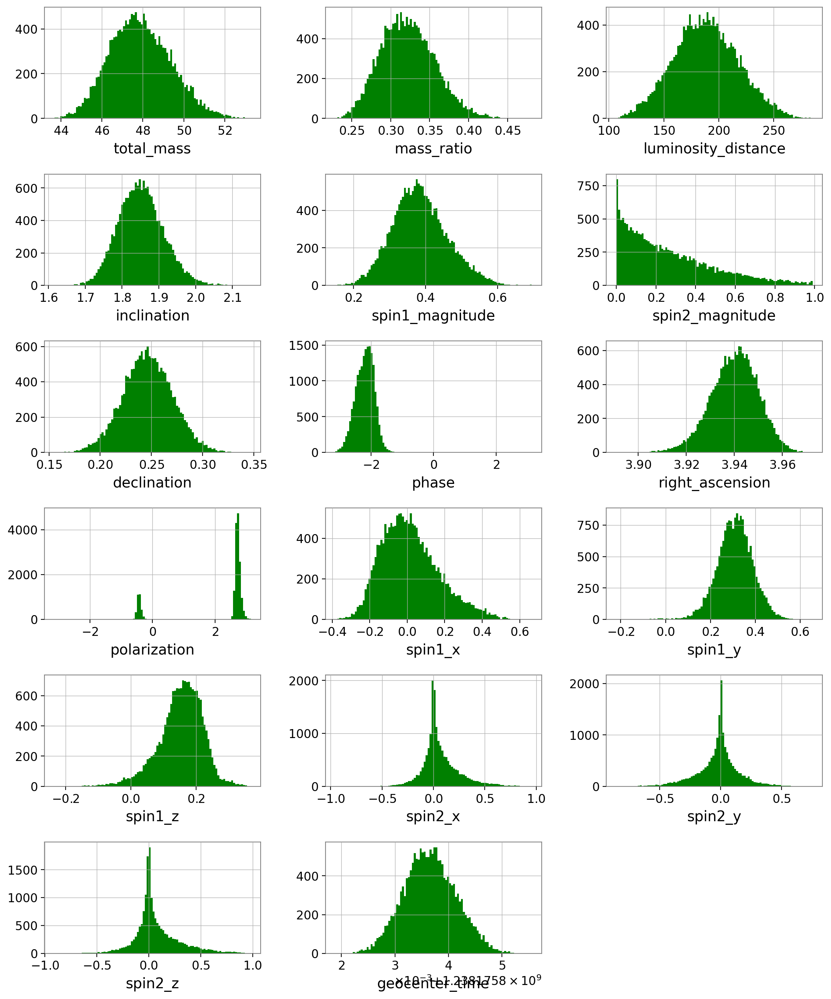

In [14]:
# Transform chains to physical space for plotting
masked_chain_phys = lm.samp_to_phys(masked_chain.T)

fig, axes = plt.subplots(6,3,figsize=(14,20*(6/7))) 

for param, ax in zip(masked_chain_phys.keys(), axes.flatten()):

    ax.hist(masked_chain_phys[param], bins=100, color='green')
    ax.set_xlabel(param)

axes[-1][-1].set_visible(False)
plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.show()

The distributions look correct, so grab `nwalkers=512` samples and save those as the initial walkers. 

In [16]:
idxs = np.random.choice(masked_chain.shape[0], size=512, replace=False)
p0 = masked_chain[idxs]

# add a tiny perturbation to each p0
noise = np.random.uniform(-0.001, 0.001, size=p0.shape)

# time pert is smaller
noise[:,lm.sampled_keys.index('geocenter_time')] = np.random.uniform(-0.00001, 0.00001, size=(512,))

p0_with_noise = p0 + noise
print(p0_with_noise.shape)

(512, 20)


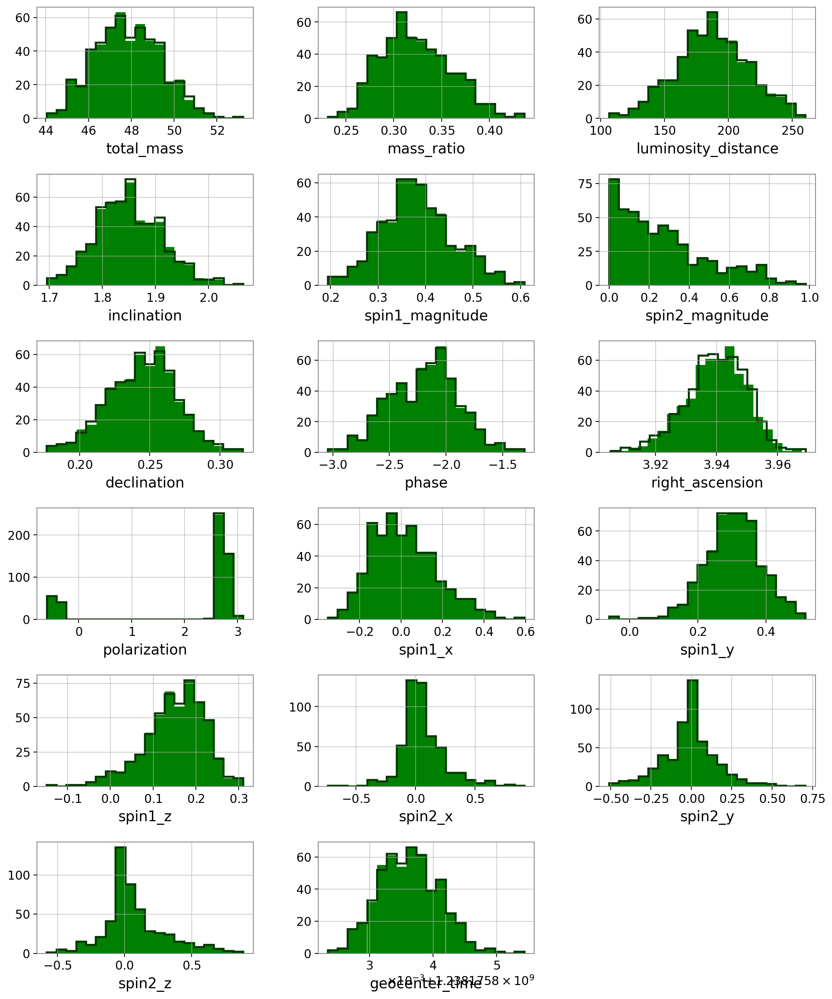

In [17]:
# check once more that these look good
p0_phys = lm.samp_to_phys(p0.T)
p0_noise_phys = lm.samp_to_phys(p0_with_noise.T)

fig, axes = plt.subplots(6,3,figsize=(14,20*(6/7))) 
for param, ax in zip(p0_phys.keys(), axes.flatten()):

    ax.hist(p0_phys[param], bins=20, color='green')
    ax.hist(p0_noise_phys[param], bins=20, color='#033500', histtype='step', lw=2)
    ax.set_xlabel(param)

axes[-1][-1].set_visible(False)
plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.show()

In [18]:
# Save!
savepath = 'custom_initial_walkers.npy'
overwrite = True 

if overwrite:
    np.save(savepath, p0)

In [19]:
# Check that it saved correctly
p0_loaded = np.load(savepath)

print(sum(sum(p0==p0_loaded))/len(p0.flatten()))

1.0
